# Calculate suspect score for manufacturing claims

# Problem statement

**Author** : Sunil Yadav || yadav.sunil83@gmail.com || +91 96206 38383 || 

# Solution Approach



# Solution

## Lib Imports

In [2]:

import set_base_path
import src.utils.eda as eu
import numpy as np
import pandas as pd
from IPython.display import display
import plotly.figure_factory as ff
import plotly.graph_objects as go
from enum import Enum, auto
from typing import List, Sequence, Tuple
from sklearn.model_selection import train_test_split
import matplotlib.pyplot as plt
import seaborn as sns
import plotly.express as px
from sklearn.experimental import enable_iterative_imputer
from sklearn.impute import IterativeImputer
import warnings
from src.constants import RAW_DATA_PATH, INTERIM_DATA_PATH
warnings.filterwarnings('ignore')

In [3]:
# Ignore warnings


## Data load

In [4]:
# Load Data

metadata = pd.read_csv(RAW_DATA_PATH/'metadata.zip')



## Pandas settings

In [5]:
pd.options.display.max_columns = 300
pd.options.display.max_rows = 300
pd.options.display.width = None
pd.options.display.max_colwidth = 100
pd.options.display.precision = 3


# EDA

## Data Overview

In [6]:
eu.get_data_frame_overview(metadata, 2)


Shape:
(414020, 19)
--------------------------------------------------

DTypes:
cord_uid             object
sha                  object
source_x             object
title                object
doi                  object
pmcid                object
pubmed_id            object
license              object
abstract             object
publish_time         object
authors              object
journal              object
mag_id              float64
who_covidence_id     object
arxiv_id             object
pdf_json_files       object
pmc_json_files       object
url                  object
s2_id               float64
dtype: object
--------------------------------------------------

Total Nulls:
2941134
--------------------------------------------------

Nulls Percentage:
mag_id              100.00
arxiv_id             98.72
pmc_json_files       73.51
pdf_json_files       66.34
sha                  66.34
pmcid                64.58
who_covidence_id     60.42
pubmed_id            50.67
doi            

,cord_uid,sha,source_x,title,doi,pmcid,pubmed_id,license,abstract,publish_time,authors,journal,mag_id,who_covidence_id,arxiv_id,pdf_json_files,pmc_json_files,url,s2_id
295835,jkjmg60e,6929ffa42c21c3a3e9342f8e04f27ca205189b00,Medline; PMC,COVID-19: Mechanisms of Vaccination and Immunity,10.3390/vaccines8030404,PMC7564472,3.27e+07,cc-by,"Vaccines are needed to protect from SARS-CoV-2, the virus causing COVID-19. Vaccines that induce...",2020-07-22,"Speiser, Daniel E.; Bachmann, Martin F.",Vaccines (Basel),NaN,NaN,NaN,document_parses/pdf_json/6929ffa42c21c3a3e9342f8e04f27ca205189b00.json,document_parses/pmc_json/PMC7564472.xml.json,https://doi.org/10.3390/vaccines8030404; https://www.ncbi.nlm.nih.gov/pubmed/32707833/,2.251e+08
12742,49v45di6,55f7d12257ab296431bff4f93a6111deec0b63cb,PMC,Efficacy of Milrinone Plus Sildenafil in the Treatment of Neonates with Persistent Pulmonary Hyp...,10.1007/s40272-020-00412-4,PMC7453074,32856285,no-cc,BACKGROUND: The management of severe persistent pulmonary hypertension (PPHN) can be very challe...,2020-08-28,"El-Ghandour, Mamdouh; Hammad, Bahaa; Ghanem, Mohamed; Antonios, Manal A. M.",Paediatr Drugs,NaN,NaN,NaN,document_parses/pdf_json/55f7d12257ab296431bff4f93a6111deec0b63cb.json,document_parses/pmc_json/PMC7453074.xml.json,https://www.ncbi.nlm.nih.gov/pmc/articles/PMC7453074/,NaN


--------------------------------------------------

Head:



,cord_uid,sha,source_x,title,doi,pmcid,pubmed_id,license,abstract,publish_time,authors,journal,mag_id,who_covidence_id,arxiv_id,pdf_json_files,pmc_json_files,url,s2_id
0,ug7v899j,d1aafb70c066a2068b02786f8929fd9c900897fb,PMC,Clinical features of culture-proven Mycoplasma pneumoniae infections at King Abdulaziz Universit...,10.1186/1471-2334-1-6,PMC35282,11472636,no-cc,OBJECTIVE: This retrospective chart review describes the epidemiology and clinical features of 4...,2001-07-04,"Madani, Tariq A; Al-Ghamdi, Aisha A",BMC Infect Dis,NaN,NaN,NaN,document_parses/pdf_json/d1aafb70c066a2068b02786f8929fd9c900897fb.json,document_parses/pmc_json/PMC35282.xml.json,https://www.ncbi.nlm.nih.gov/pmc/articles/PMC35282/,NaN
1,02tnwd4m,6b0567729c2143a66d737eb0a2f63f2dce2e5a7d,PMC,Nitric oxide: a pro-inflammatory mediator in lung disease?,10.1186/rr14,PMC59543,11667967,no-cc,Inflammatory diseases of the respiratory tract are commonly associated with elevated production ...,2000-08-15,"Vliet, Albert van der; Eiserich, Jason P; Cross, Carroll E",Respir Res,NaN,NaN,NaN,document_parses/pdf_json/6b0567729c2143a66d737eb0a2f63f2dce2e5a7d.json,document_parses/pmc_json/PMC59543.xml.json,https://www.ncbi.nlm.nih.gov/pmc/articles/PMC59543/,NaN


--------------------------------------------------

Tail:



,cord_uid,sha,source_x,title,doi,pmcid,pubmed_id,license,abstract,publish_time,authors,journal,mag_id,who_covidence_id,arxiv_id,pdf_json_files,pmc_json_files,url,s2_id
414018,hsy9qts3,2b005f429d646f6130ad607505dda333746ba1c9,Medline; PMC,Genome Sequences of SARS-CoV-2 Strains Detected in Hong Kong,10.1128/mra.00697-20,PMC7393966,3.27e+07,cc-by,We sequenced severe acute respiratory syndrome coronavirus 2 (SARS-CoV-2) genomes from deep thro...,2020-07-30,"Au, Chun Hang; Chan, Wai Sing; Lam, Ho Yin; Ho, Dona N.; Lam, Simon Y. M.; Zee, Jonpaul S. T.; C...",Microbiol Resour Announc,NaN,NaN,NaN,document_parses/pdf_json/2b005f429d646f6130ad607505dda333746ba1c9.json,document_parses/pmc_json/PMC7393966.xml.json,https://www.ncbi.nlm.nih.gov/pubmed/32732237/; https://doi.org/10.1128/mra.00697-20,2.209e+08
414019,gtzi2isl,d2315ce7c2c23fea2e867e3c965f95ed8e12298f,Medline; PMC,Driving forces for COVID-19 clinical trials using chloroquine: the need to choose the right rese...,10.1590/0037-8682-0155-2020,PMC7156252,3.23e+07,cc-by,NaN,2020-04-06,"Monteiro, Wuelton Marcelo; Brito-Sousa, Jose Diego; Baía-da-Silva, Djane; de Melo, Gisely Cardos...",Revista da Sociedade Brasileira de Medicina Tropical,NaN,NaN,NaN,document_parses/pdf_json/d2315ce7c2c23fea2e867e3c965f95ed8e12298f.json,document_parses/pmc_json/PMC7156252.xml.json,https://www.ncbi.nlm.nih.gov/pubmed/32267301/; https://doi.org/10.1590/0037-8682-0155-2020,2.154e+08


--------------------------------------------------

Describe:



,count,unique,top,freq,mean,std,min,25%,50%,75%,max
cord_uid,414020,395682,kgpo6psq,64,NaN,NaN,NaN,NaN,NaN,NaN,NaN
sha,139370,139359,0ed3c6a5559cd73307184f51fc53ccc76da559bc,3,NaN,NaN,NaN,NaN,NaN,NaN,NaN
source_x,414020,40,WHO,162456,NaN,NaN,NaN,NaN,NaN,NaN,NaN
title,413804,342211,Reply,92,NaN,NaN,NaN,NaN,NaN,NaN,NaN
doi,233387,232853,10.1016/j.scitotenv.2020.139397,9,NaN,NaN,NaN,NaN,NaN,NaN,NaN
pmcid,146639,146639,PMC7280598,1,NaN,NaN,NaN,NaN,NaN,NaN,NaN
pubmed_id,2.04e+05,2.04e+05,3.26e+07,3,NaN,NaN,NaN,NaN,NaN,NaN,NaN
license,414020,18,unk,234074,NaN,NaN,NaN,NaN,NaN,NaN,NaN
abstract,298205,266344,An amendment to this paper has been published and can be accessed via a link at the top of the p...,182,NaN,NaN,NaN,NaN,NaN,NaN,NaN
publish_time,413800,7429,2020,161931,NaN,NaN,NaN,NaN,NaN,NaN,NaN


--------------------------------------------------

Info:

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 414020 entries, 0 to 414019
Data columns (total 19 columns):
 #   Column            Non-Null Count   Dtype  
---  ------            --------------   -----  
 0   cord_uid          414020 non-null  object 
 1   sha               139370 non-null  object 
 2   source_x          414020 non-null  object 
 3   title             413804 non-null  object 
 4   doi               233387 non-null  object 
 5   pmcid             146639 non-null  object 
 6   pubmed_id         204253 non-null  object 
 7   license           414020 non-null  object 
 8   abstract          298205 non-null  object 
 9   publish_time      413800 non-null  object 
 10  authors           401737 non-null  object 
 11  journal           387461 non-null  object 
 12  mag_id            0 non-null       float64
 13  who_covidence_id  163867 non-null  object 
 14  arxiv_id          5306 non-null    object 
 15  pdf_json_

None

--------------------------------------------------

Count of data types:



object     17
float64     2
dtype: int64

--------------------------------------------------

Column Names:



Index(['cord_uid', 'sha', 'source_x', 'title', 'doi', 'pmcid', 'pubmed_id',
       'license', 'abstract', 'publish_time', 'authors', 'journal', 'mag_id',
       'who_covidence_id', 'arxiv_id', 'pdf_json_files', 'pmc_json_files',
       'url', 's2_id'],
      dtype='object')

### Univariate

#### value counts

In [7]:
eu.print_value_count_percents(metadata[['license']])


Value Counts for license


Value,Value Counts,Percent
unk,234074,56.54%
no-cc,79387,19.17%
cc-by,44653,10.79%
els-covid,17807,4.30%
cc-by-nc,8814,2.13%
medrxiv,8337,2.01%
cc-by-nc-nd,7850,1.90%
arxiv,5020,1.21%
biorxiv,3162,0.76%
cc-by-nc-sa,2209,0.53%


In [8]:
eu.print_value_count_percents(metadata[['journal']])


Value Counts for journal


#### value counts plots

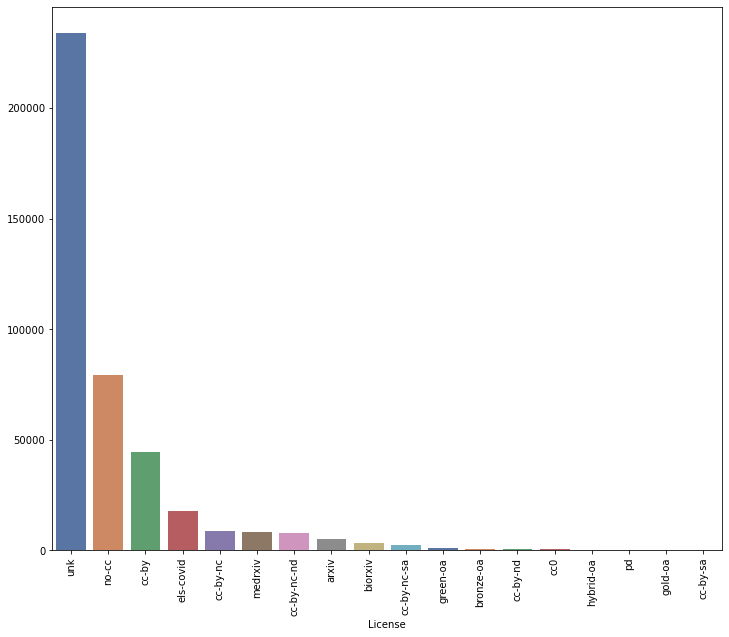

In [9]:
eu.plot_univariate_categorical_columns(metadata[['license']], x_rotation=90, plot_limit=50)

In [10]:
eu.plot_univariate_categorical_columns(metadata[['license']], interactive=True, plot_limit=50, log_y=True)


Plotting only top(in decending order) 50 categories


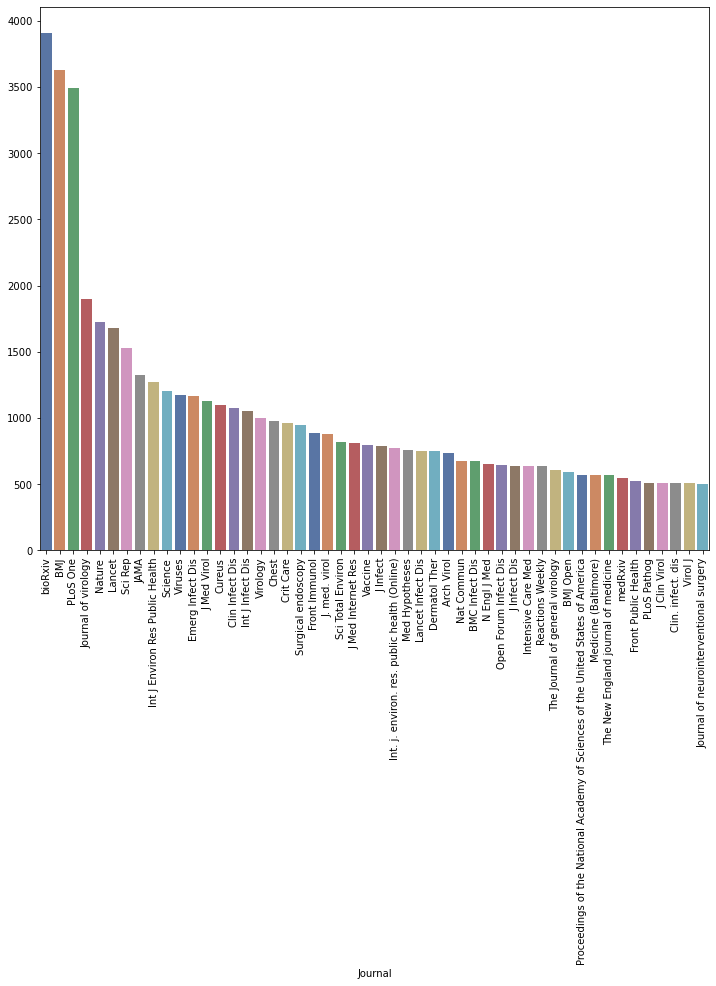

In [11]:
eu.plot_univariate_categorical_columns(metadata[['journal']], x_rotation=90, plot_limit=50)

In [12]:
eu.plot_univariate_categorical_columns(metadata[['journal']], interactive=True, plot_limit=50, log_y=True)


Plotting only top(in decending order) 50 categories


#### distributions

In [13]:
metadata.dtypes

cord_uid             object
sha                  object
source_x             object
title                object
doi                  object
pmcid                object
pubmed_id            object
license              object
abstract             object
publish_time         object
authors              object
journal              object
mag_id              float64
who_covidence_id     object
arxiv_id             object
pdf_json_files       object
pmc_json_files       object
url                  object
s2_id               float64
dtype: object

In [14]:
metadata = metadata.convert_dtypes()

In [15]:
metadata.dtypes


cord_uid            string
sha                 string
source_x            string
title               string
doi                 string
pmcid               string
pubmed_id           object
license             string
abstract            string
publish_time        string
authors             string
journal             string
mag_id               Int64
who_covidence_id    string
arxiv_id            object
pdf_json_files      string
pmc_json_files      string
url                 string
s2_id                Int64
dtype: object

In [16]:
publish_time = 'publish_time'

In [17]:
sorted(list(metadata[metadata[publish_time].apply(lambda x: str(x).startswith('2021-'))][publish_time]), reverse=True)[:30]

['2021-12-31',
 '2021-12-31',
 '2021-12-31',
 '2021-12-31',
 '2021-12-31',
 '2021-12-31',
 '2021-12-31',
 '2021-12-31',
 '2021-12-31',
 '2021-12-31',
 '2021-12-31',
 '2021-12-31',
 '2021-12-31',
 '2021-12-31',
 '2021-12-31',
 '2021-12-31',
 '2021-12-31',
 '2021-12-31',
 '2021-12-19',
 '2021-12-01',
 '2021-12-01',
 '2021-12-01',
 '2021-08-01',
 '2021-06-01',
 '2021-06-01',
 '2021-05-01',
 '2021-05-01',
 '2021-04-01',
 '2021-03-31',
 '2021-03-15']

In [18]:
metadata[publish_time].head()


0    2001-07-04
1    2000-08-15
2    2000-08-25
3    2001-02-22
4    2001-05-11
Name: publish_time, dtype: string

In [19]:
metadata[publish_time].tail()

414015    2012-01-26
414016    2020-10-20
414017    2020-06-18
414018    2020-07-30
414019    2020-04-06
Name: publish_time, dtype: string

In [20]:
metadata[publish_time] = pd.to_datetime(metadata[publish_time], format='%Y-%m-%d')


In [21]:
metadata[publish_time].head()


0   2001-07-04
1   2000-08-15
2   2000-08-25
3   2001-02-22
4   2001-05-11
Name: publish_time, dtype: datetime64[ns]

In [22]:
metadata[publish_time].tail()

414015   2012-01-26
414016   2020-10-20
414017   2020-06-18
414018   2020-07-30
414019   2020-04-06
Name: publish_time, dtype: datetime64[ns]

In [23]:
publish_year = 'publish_year'
publish_month = 'publish_month'
publish_day = 'publish_day'


In [24]:
pub_dates: pd.Series = metadata[publish_time].dt
metadata[publish_year] = pub_dates.year
metadata[publish_month] = pub_dates.month
metadata[publish_day] = pub_dates.dayofweek


In [25]:
metadata[metadata[publish_time].isna() | metadata[publish_year].isna()][[publish_time, publish_year]]


,publish_time,publish_year
112492,NaT,NaN
112596,NaT,NaN
112606,NaT,NaN
112632,NaT,NaN
112678,NaT,NaN
112699,NaT,NaN
112709,NaT,NaN
112730,NaT,NaN
112738,NaT,NaN
112747,NaT,NaN


In [26]:
year_wise_paper_published = metadata.groupby(publish_year)['cord_uid'].count().reset_index()


In [27]:
plt_frame: pd.DataFrame = year_wise_paper_published.copy()
plt_frame[publish_year] = plt_frame[publish_year].astype(str)
plt_frame[publish_year] = plt_frame[publish_year].apply(lambda x: x.split('.')[0] if len(x) > 0 else x)
plt_frame.columns = [publish_year, 'paper_count']

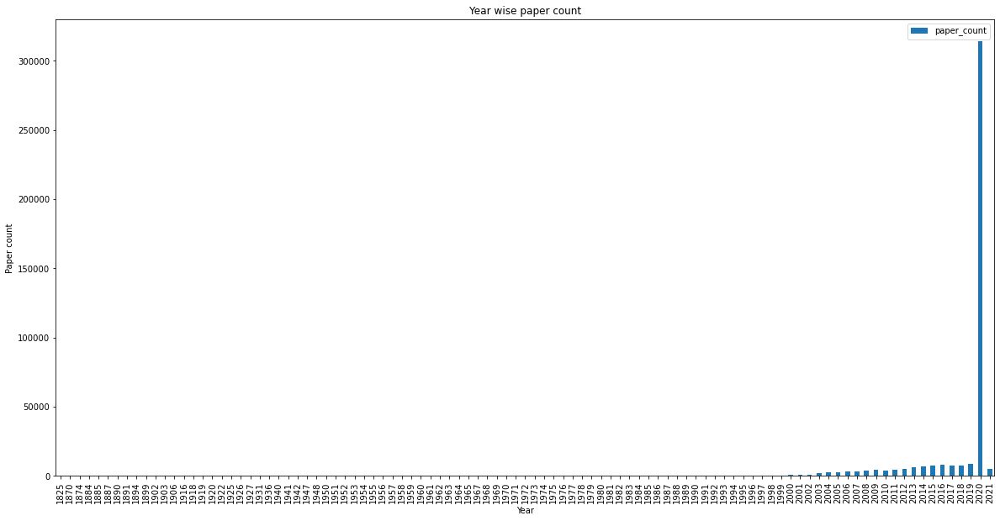

In [28]:

plt_frame.plot(x=publish_year,
               y='paper_count', kind='bar', figsize=(20, 10), title="Year wise paper count",
               xlabel="Year", ylabel="Paper count")
plt.show()

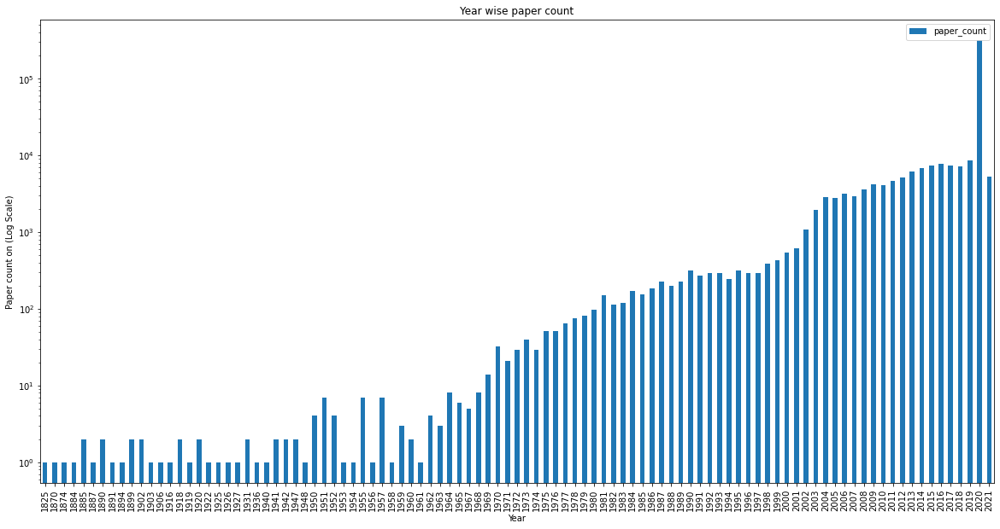

In [29]:

plt_frame.plot(x=publish_year,
               y='paper_count', kind='bar', figsize=(20, 10), title="Year wise paper count", logy=True,
               xlabel="Year", ylabel="Paper count on (Log Scale)")
plt.show()
# eu.plot_two_variables(plt_frame, publish_year, 'paper_count')

## Drop unwanted columns

## Fix column dtypes

#### Plotting numeric and categorical

### Bi-variate

### Correlation
 Mostly positive correlated data

#### Numeric-Numeric (Scatter plot)

####  Numeric-Categorical (Box and violin)

#### Categorical-Categorical (Cross Table)

In [31]:

# pd.crosstab(metadata[publish_year], metadata[['journal', 'license']], rownames=["Publish Year"], colnames=["Journal, 'License"])
pd.crosstab(metadata['journal'], metadata['license'])

license,arxiv,biorxiv,bronze-oa,cc-by,cc-by-nc,cc-by-nc-nd,cc-by-nc-sa,cc-by-nd,cc-by-sa,cc0,els-covid,gold-oa,green-oa,hybrid-oa,medrxiv,no-cc,pd,unk
journal,,,,,,,,,,,,,,,,,,
&#x000d6;kologie,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0
&#x000d6;sterr Wasser- und Abfallw,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,9,0,0
&#x000dc;ber die Gesundheitsphilosophie zum Pr&#x000e4;sentismus,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0
&#x000e4;sthet dermatol kosmetol,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,10,0,0
"&quot;21st Workshop &quot;&quot;&quot;&quot;From Objects to Agents&quot;&quot;&quot;&quot;, WOA 2020&quot;",0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,2
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
醫學與健康期刊,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,2
长春中医药大学学报,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1
青岛远洋船员职业学院学报,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,2
